# Imports
# link date -- https://github.com/microgravitas/network-corpus/blob/master/networks

In [6]:
import os
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import warnings
from random import randint
from networkx.algorithms import community

import importlib
import utils.fit as fit
import utils.read as read
import utils.Chromosome as Chromosome

importlib.reload(fit)
importlib.reload(read)
importlib.reload(Chromosome)

from utils.Chromosome import Chromosome

# GA - profa

In [9]:
class GA:
    def __init__(self, param = None, problParam = None):
        self.__param = param
        self.__problParam = problParam
        self.__population = []

    @property
    def population(self):
        return self.__population

    def initialisation(self):
        for _ in range(0, self.__param['popSize']):
            c = Chromosome(self.__problParam)
            self.__population.append(c)

    def evaluation(self):
        for c in self.__population:
            c.fitness = self.__problParam['function'](c.repres, self.__problParam["network"])

    def bestChromosome(self):
        best = self.__population[0]
        for c in self.__population:
            if c.fitness > best.fitness:
                best = c
        return best

    def worstChromosome(self):
        best = self.__population[0]
        for c in self.__population:
            if c.fitness < best.fitness:
                best = c
        return best

    def selection(self):
        pos1 = randint(0, self.__param['popSize'] - 1)
        pos2 = randint(0, self.__param['popSize'] - 1)
        if self.__population[pos1].fitness < self.__population[pos2].fitness:
            return pos1
        else:
            return pos2

    def oneGeneration(self):
        newPop = []
        for _ in range(self.__param['popSize']):
            p1 = self.__population[self.selection()]
            p2 = self.__population[self.selection()]
            off = p1.crossover(p2)
            off.mutation()
            newPop.append(off)
        self.__population = newPop
        self.evaluation()

    def oneGenerationElitism(self):
        newPop = [self.bestChromosome()]
        for _ in range(self.__param['popSize'] - 1):
            p1 = self.__population[self.selection()]
            p2 = self.__population[self.selection()]
            off = p1.crossover(p2)
            off.mutation()
            newPop.append(off)
        self.__population = newPop
        self.evaluation()

    def oneGenerationSteadyState(self):
        for _ in range(self.__param['popSize']):
            p1 = self.__population[self.selection()]
            p2 = self.__population[self.selection()]
            off = p1.crossover(p2)
            off.mutation()
            off.fitness = self.__problParam['function'](off.repres)
            worst = self.worstChromosome()
            if off.fitness < worst.fitness:
                worst = off

In [8]:
def plot(communities,network,imgSize=(10, 10)):
    
    A=np.matrix(network["mat"])
    G=nx.from_numpy_array(A)
    pos = nx.spring_layout(G)
    
    plt.figure(figsize=imgSize)
    nx.draw_networkx_nodes(G, pos, node_size=600, cmap=plt.cm.RdYlBu, node_color=communities)
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    labels = {i: str(communities[i]) for i in range(len(communities))}
    nx.draw_networkx_labels(G, pos, labels, font_size=16, font_color='black')
    plt.show()

# Tool find  solution functions 

In [3]:
def findSolutionTool(network):
    A=np.matrix(network["mat"])
    G=nx.from_numpy_array(A)
    comp = community.girvan_newman(G)
    best_gn_communities = None
    best_gn_modularity = -1.0

    for communities_tuple in comp:
        current_modularity = community.modularity(G, communities_tuple)
        if current_modularity > best_gn_modularity:
            best_gn_modularity = current_modularity
            best_gn_communities = communities_tuple
        if len(communities_tuple) >= G.number_of_nodes() / 2:
             break
    
    if best_gn_communities is not None:
        communities = [0] * G.number_of_nodes()
        for idx, community_group in enumerate(best_gn_communities):
            for node in community_group:
                communities[node] = idx
        plot(communities, network, imgSize=(20, 20))
    
    
    return best_gn_communities, best_gn_modularity

# Cod propriu find solution

In [16]:
def findSolution(network, populationSize=16, numberOfIterations=100):
    warnings.simplefilter('ignore')

    A = np.matrix(network["mat"])
    G = nx.from_numpy_array(A)
    pos = nx.spring_layout(G)

    gaParam = {'popSize': populationSize, 'noGen': numberOfIterations}
    problParam = {'function': fit.modularity, 'noNodes': network["noNodes"], 'network': network}

    ga = GA(gaParam, problParam)
    ga.initialisation()
    ga.evaluation()
    
    best = -1000
    communities = []
    allBestFitnesses = []
    allAvgFitnesses = []
    generations = []
    
    for g in range(numberOfIterations):
        allPotentialSolutions = [c.fitness for c in ga.population]
        bestSol = ga.bestChromosome().fitness
        allBestFitnesses.append(bestSol)
        allAvgFitnesses.append(sum(allPotentialSolutions) / len(allPotentialSolutions))
        generations.append(g)
        
        ga.oneGenerationElitism()
        bestChromo = ga.bestChromosome()
        if bestChromo.fitness > best:
            best = bestChromo.fitness
            communities = bestChromo.repres
    
    return communities, best

# Rezolvarea problemei cu algoritmul genetic

In [11]:
crtDir =  os.getcwd()

# Test net.in

In [19]:
filePath = os.path.join(crtDir, 'networks', 'net.in')
network = read.readNet(filePath)

## Tool

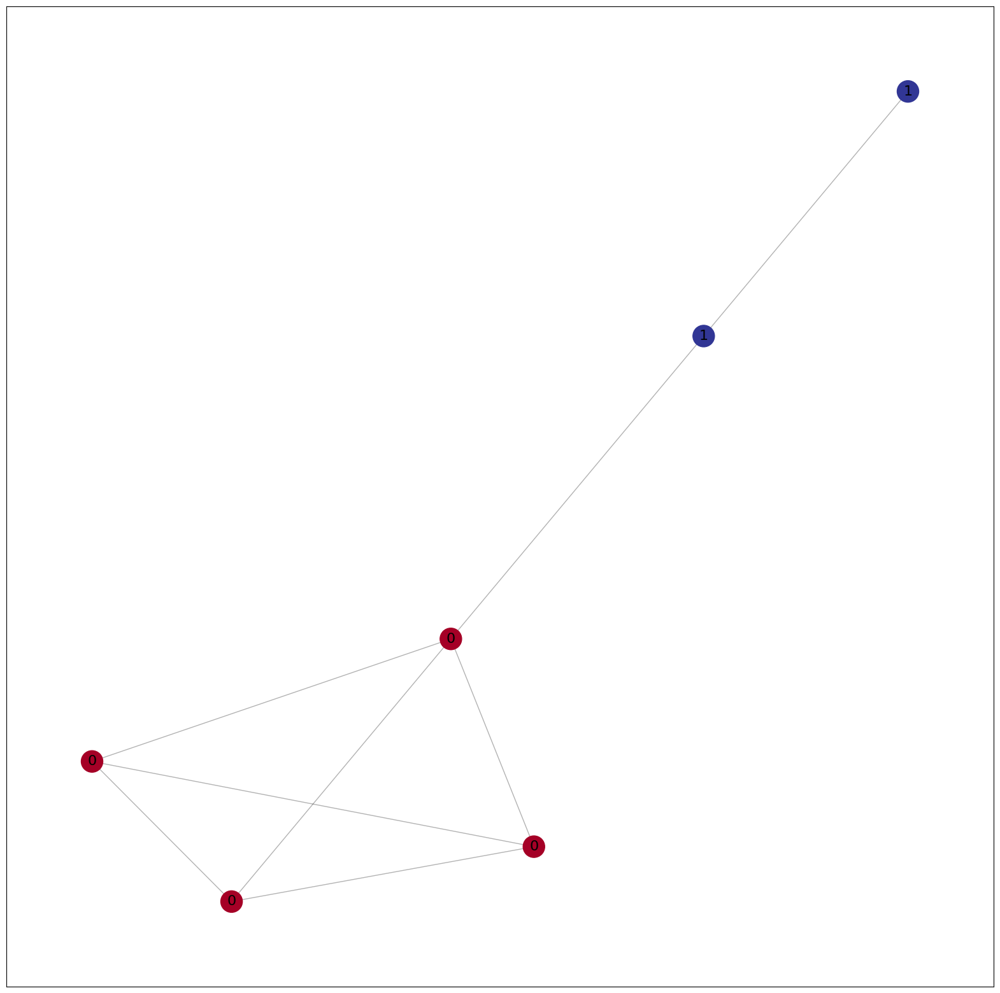

Comunitatea : ({0, 1, 2, 5}, {3, 4})
Modularitatea  0.1796875


In [282]:
c, modularity = findSolutionTool(network)
print("Comunitatea :", c)
print("Modularitatea ", modularity)

## Cod propriu

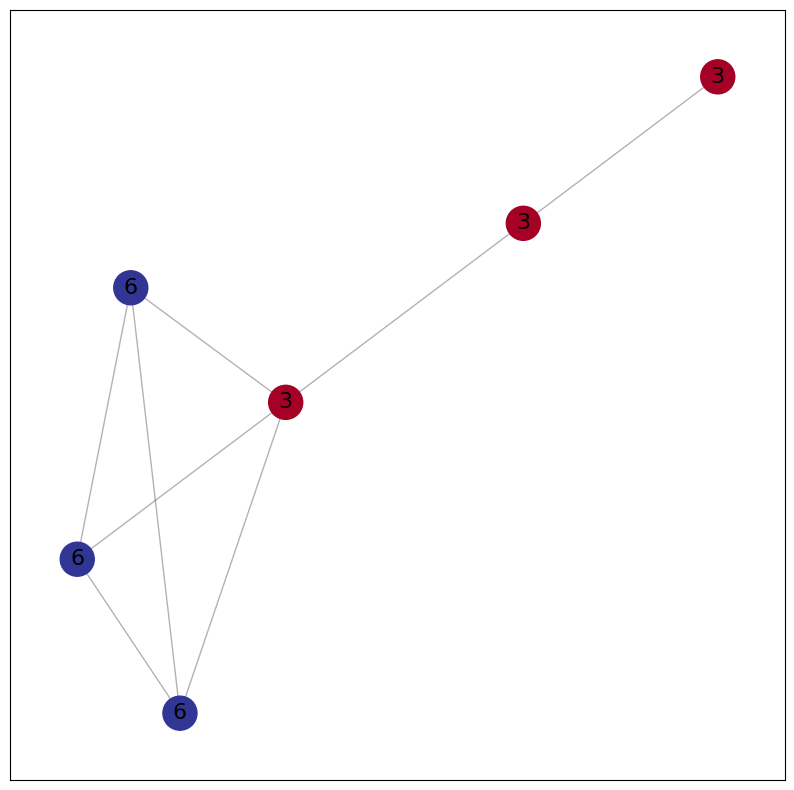

Comunitatea : [6, 6, 3, 3, 3, 6]
Modularitatea  0.1171875


In [20]:
c,modularity = findSolution(network)
plot(c, network, imgSize=(10, 10))
print("Comunitatea :", c)
print("Modularitatea ", fit.modularity(c, network))

Processing file: classLabeldolphins.txt


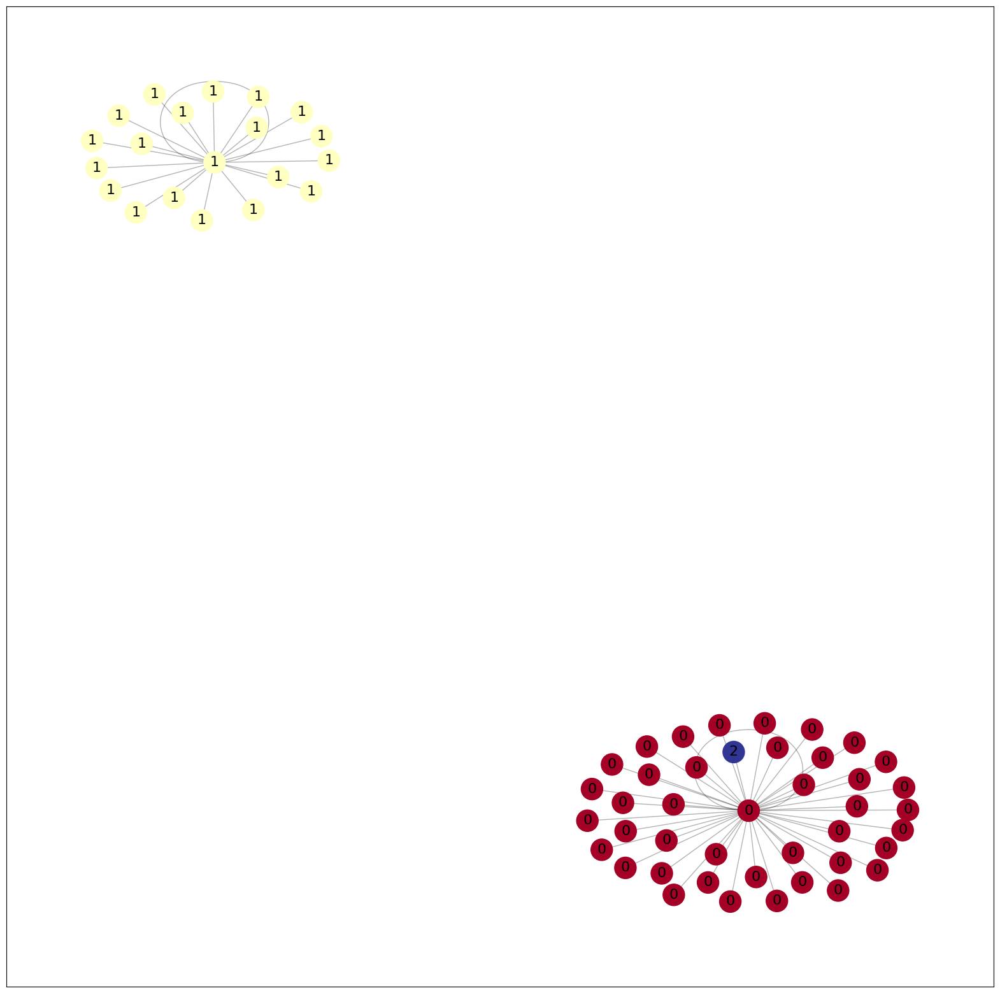

File: classLabeldolphins.txt, Comunitatea: ({0, 3, 4, 8, 10, 11, 12, 14, 15, 16, 18, 20, 21, 23, 24, 28, 29, 30, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 55, 58, 59, 61}, {1, 5, 6, 7, 9, 13, 17, 19, 22, 25, 26, 27, 31, 32, 41, 48, 54, 56, 57, 60}, {2})
File: classLabeldolphins.txt, Modularitate: 0.4317117585848074
File: classLabeldolphins.txt, Comunitatea (Cod Propriu): [51, 31, 51, 34, 8, 13, 33, 37, 51, 24, 35, 6, 32, 19, 48, 13, 42, 20, 32, 49, 19, 13, 8, 47, 60, 16, 39, 40, 21, 53, 11, 43, 34, 48, 28, 60, 17, 43, 50, 47, 35, 31, 26, 43, 10, 60, 53, 20, 45, 27, 53, 21, 43, 29, 43, 46, 43, 35, 37, 59, 46, 27]
File: classLabeldolphins.txt, Modularitate (Cod Propriu): -0.10763888888888833


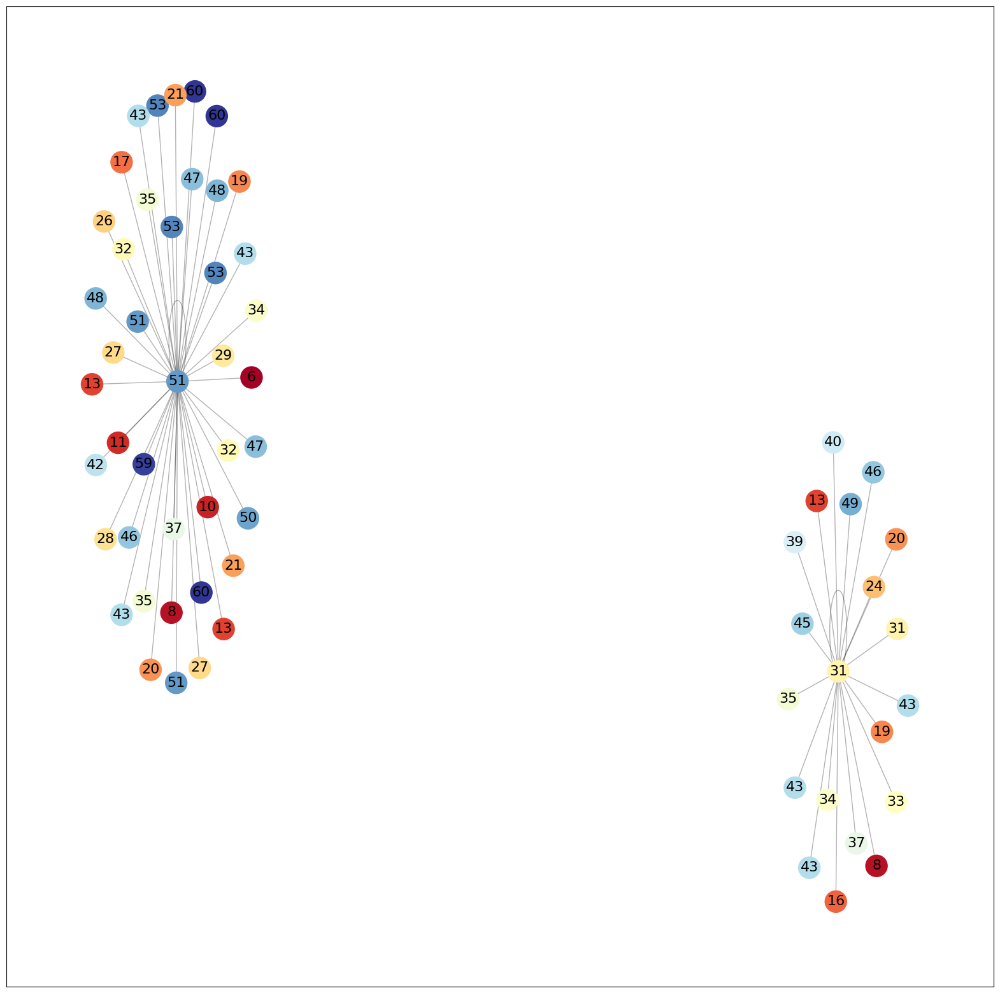

--------------------------------------------------
Processing file: classLabelfootball.txt


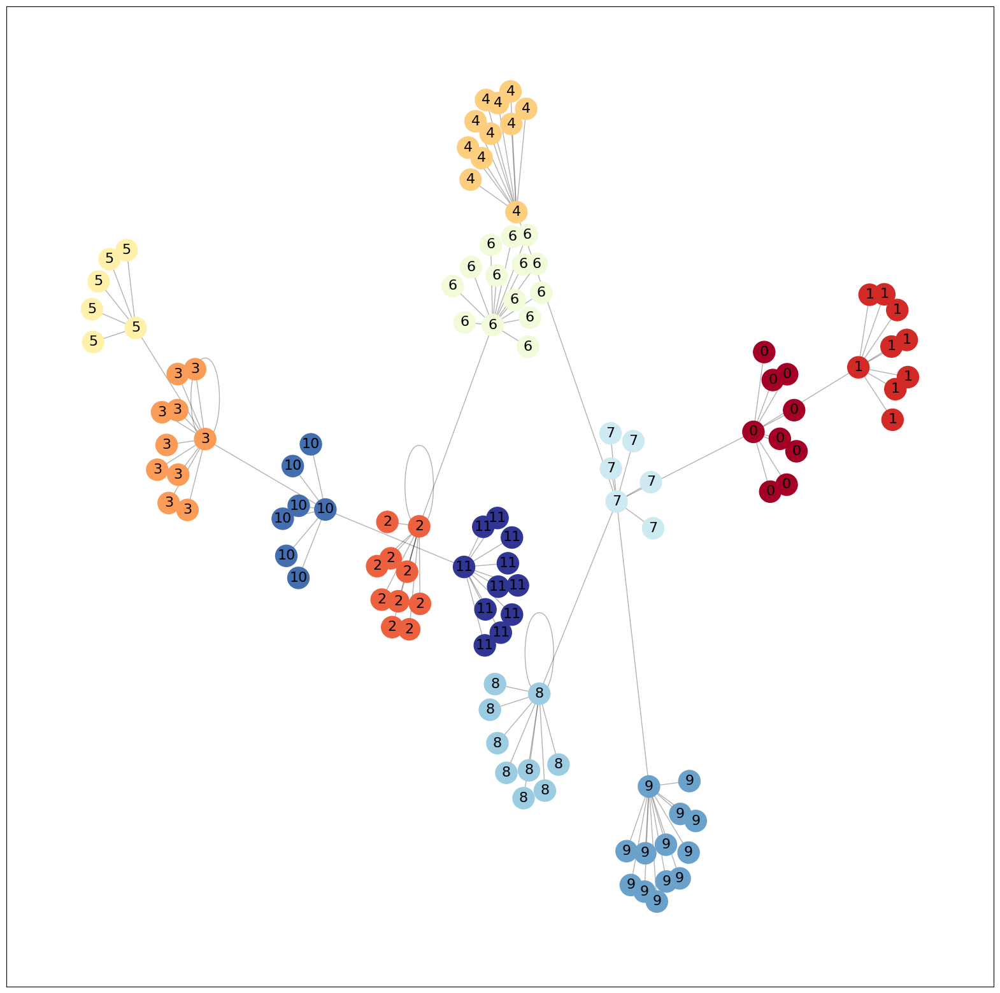

File: classLabelfootball.txt, Comunitatea: ({0, 33, 89, 37, 103, 105, 45, 109, 25}, {1, 35, 101, 79, 19, 55, 94, 29, 30}, {32, 64, 2, 100, 39, 106, 13, 15, 47, 60}, {98, 3, 102, 40, 72, 74, 107, 81, 52, 84}, {66, 4, 75, 44, 110, 48, 112, 86, 57, 91, 92}, {36, 5, 42, 80, 82, 90}, {34, 99, 6, 38, 71, 43, 12, 14, 18, 85, 54, 26, 61, 31}, {7, 104, 41, 16, 23, 93}, {68, 8, 108, 77, 78, 111, 51, 21, 22}, {96, 65, 70, 9, 76, 17, 113, 20, 87, 56, 27, 62, 95}, {97, 69, 10, 50, 24, 59, 63}, {67, 73, 11, 46, 49, 114, 83, 53, 88, 58, 28})
File: classLabelfootball.txt, Modularitate: 0.833875236294896
File: classLabelfootball.txt, Comunitatea (Cod Propriu): [70, 95, 39, 11, 33, 53, 55, 96, 49, 58, 87, 40, 43, 69, 90, 98, 56, 110, 75, 1, 19, 71, 49, 73, 15, 56, 91, 92, 88, 2, 110, 114, 17, 83, 64, 2, 3, 17, 103, 111, 62, 114, 46, 35, 79, 92, 110, 81, 60, 76, 34, 83, 57, 78, 28, 76, 87, 27, 48, 68, 80, 36, 9, 110, 94, 112, 102, 15, 49, 97, 49, 84, 8, 17, 63, 84, 25, 25, 27, 49, 51, 11, 42, 20, 71, 71,

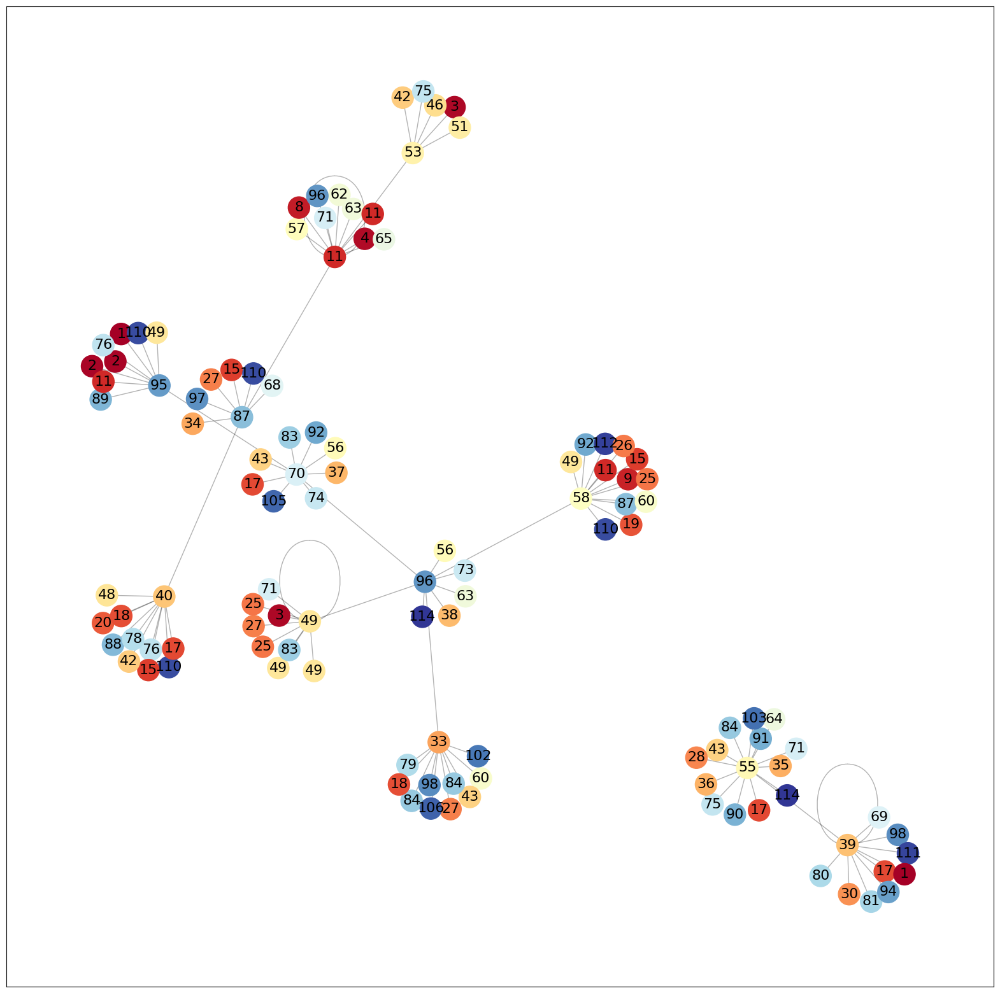

--------------------------------------------------
Processing file: classLabelkarate.txt


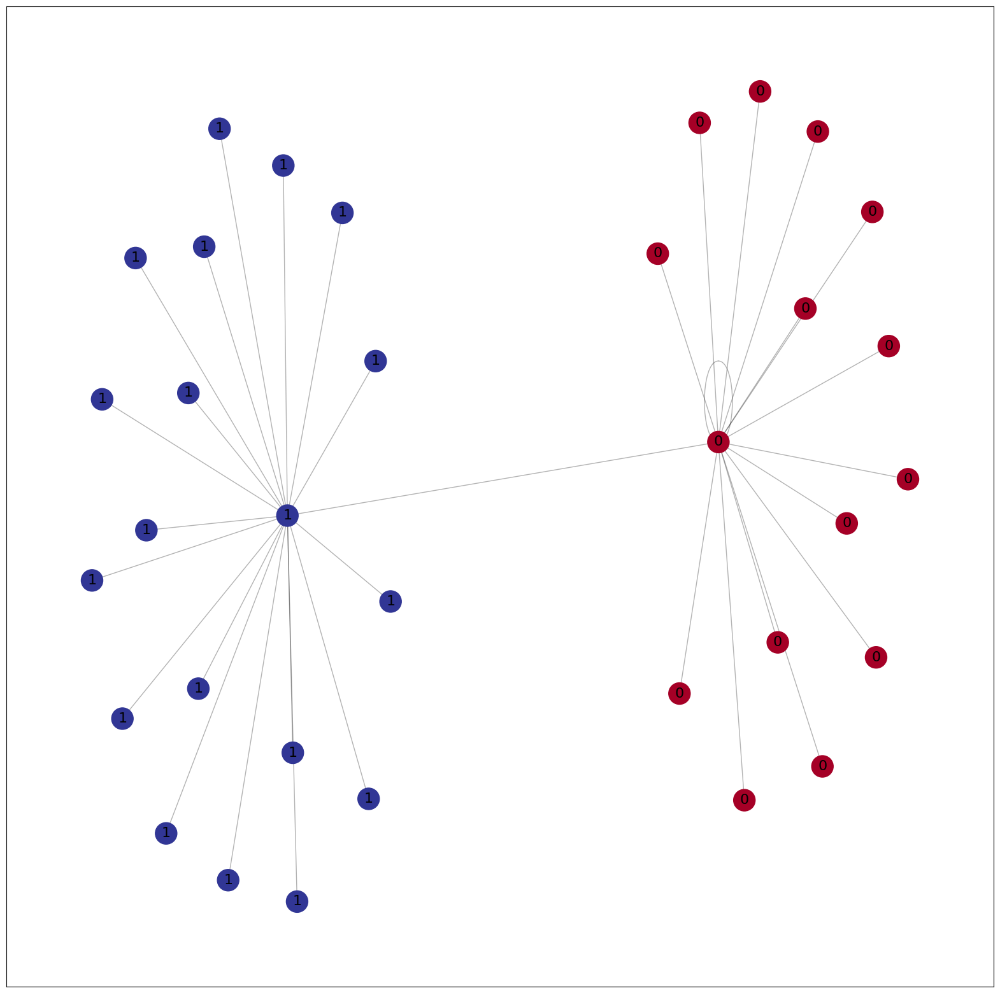

File: classLabelkarate.txt, Comunitatea: ({0, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21}, {1, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33})
File: classLabelkarate.txt, Modularitate: 0.46669550173010377
File: classLabelkarate.txt, Comunitatea (Cod Propriu): [1, 29, 31, 1, 1, 27, 31, 33, 23, 13, 30, 18, 20, 20, 30, 18, 15, 1, 19, 6, 19, 26, 23, 19, 26, 2, 33, 3, 15, 14, 33, 29, 19, 2]
File: classLabelkarate.txt, Modularitate (Cod Propriu): -0.05257116620753005


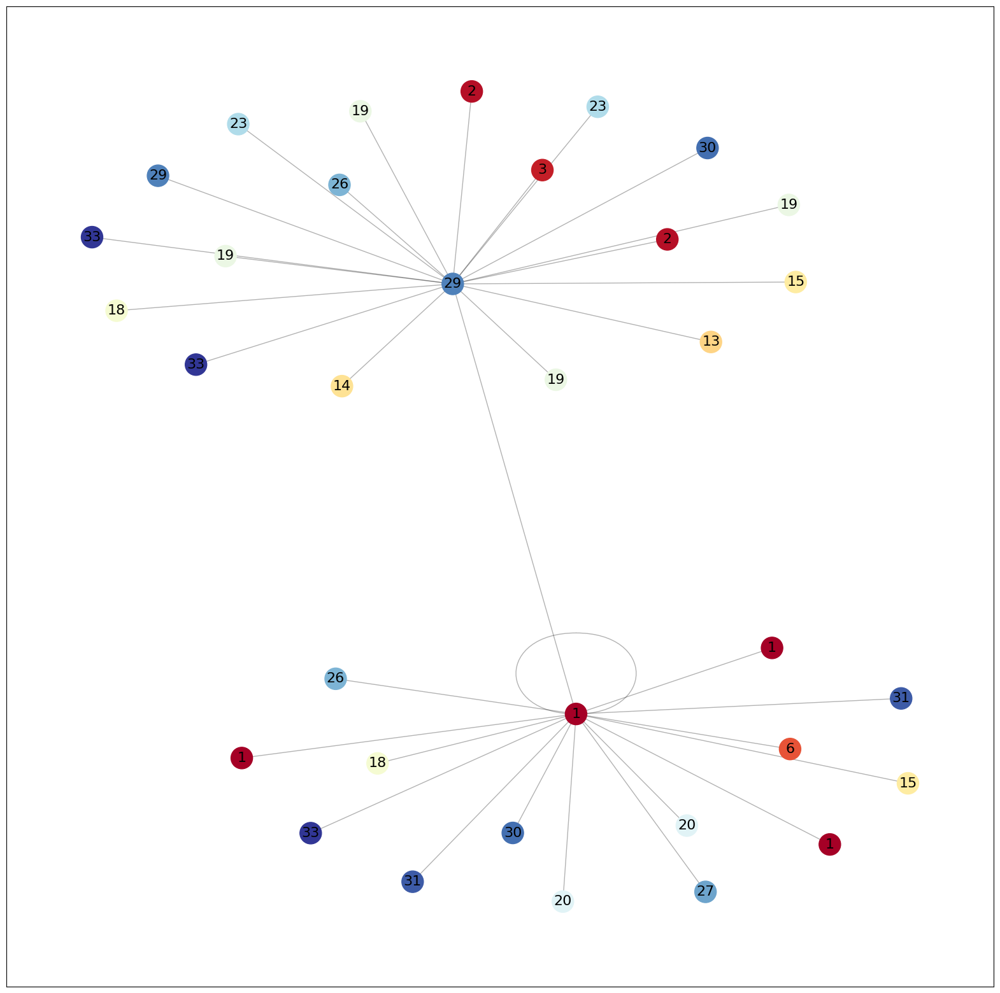

--------------------------------------------------
Processing file: classLabelkrebs.txt


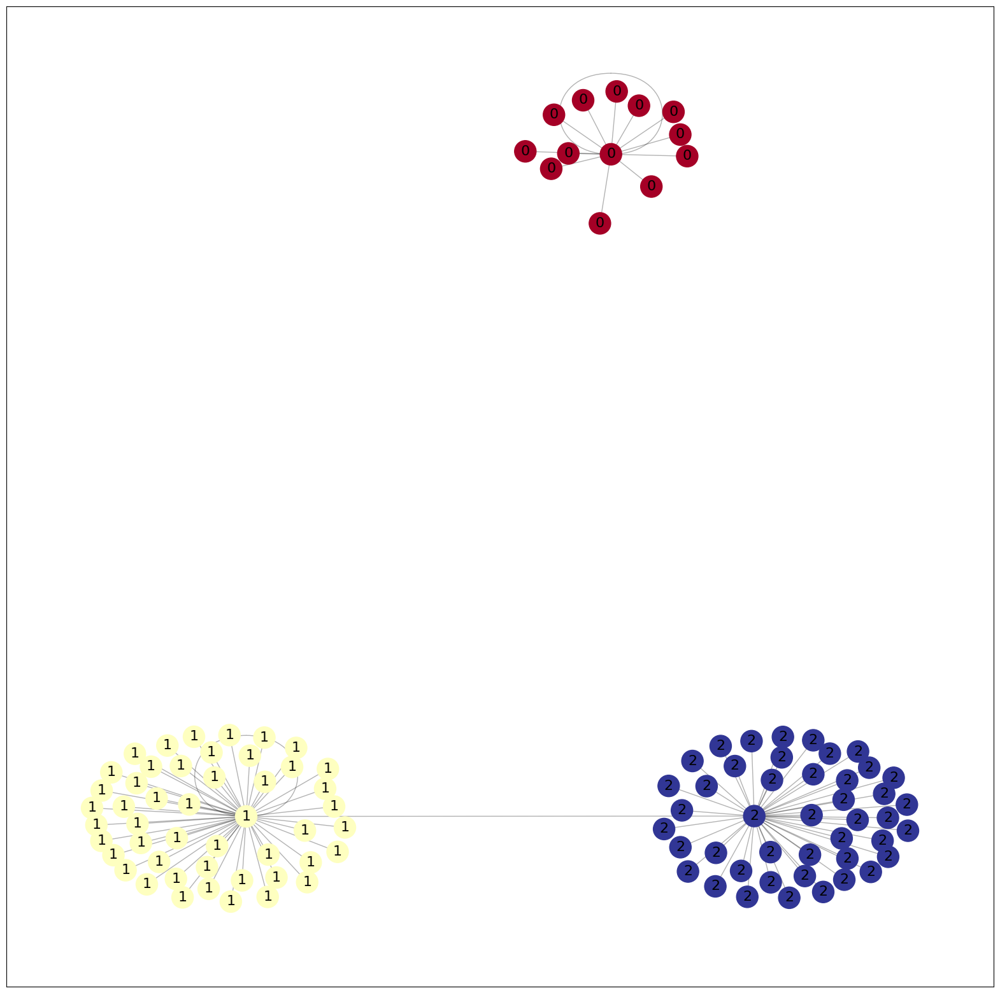

File: classLabelkrebs.txt, Comunitatea: ({0, 4, 69, 6, 7, 103, 104, 76, 46, 48, 18, 51, 28}, {1, 3, 5, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 49, 50, 52, 53, 54, 55, 56, 57, 58, 77}, {2, 30, 31, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102})
File: classLabelkrebs.txt, Modularitate: 0.5901587301587301
File: classLabelkrebs.txt, Comunitatea (Cod Propriu): [21, 56, 16, 84, 49, 24, 74, 36, 56, 44, 20, 60, 32, 73, 95, 77, 99, 54, 1, 64, 94, 102, 33, 30, 56, 64, 78, 79, 102, 77, 11, 91, 71, 76, 98, 34, 50, 75, 28, 30, 82, 13, 11, 68, 30, 31, 101, 18, 2, 98, 78, 26, 67, 61, 7, 19, 19, 6, 8, 7, 32, 31, 96, 18, 105, 15, 61, 39, 60, 65, 87, 96, 72, 33, 60, 79, 16, 44, 96, 8, 95, 100, 69, 41, 69, 40, 85, 72, 29, 46, 94, 42, 74, 103, 50, 54, 78, 64, 80, 18, 7, 62, 3, 19, 20]
File: 

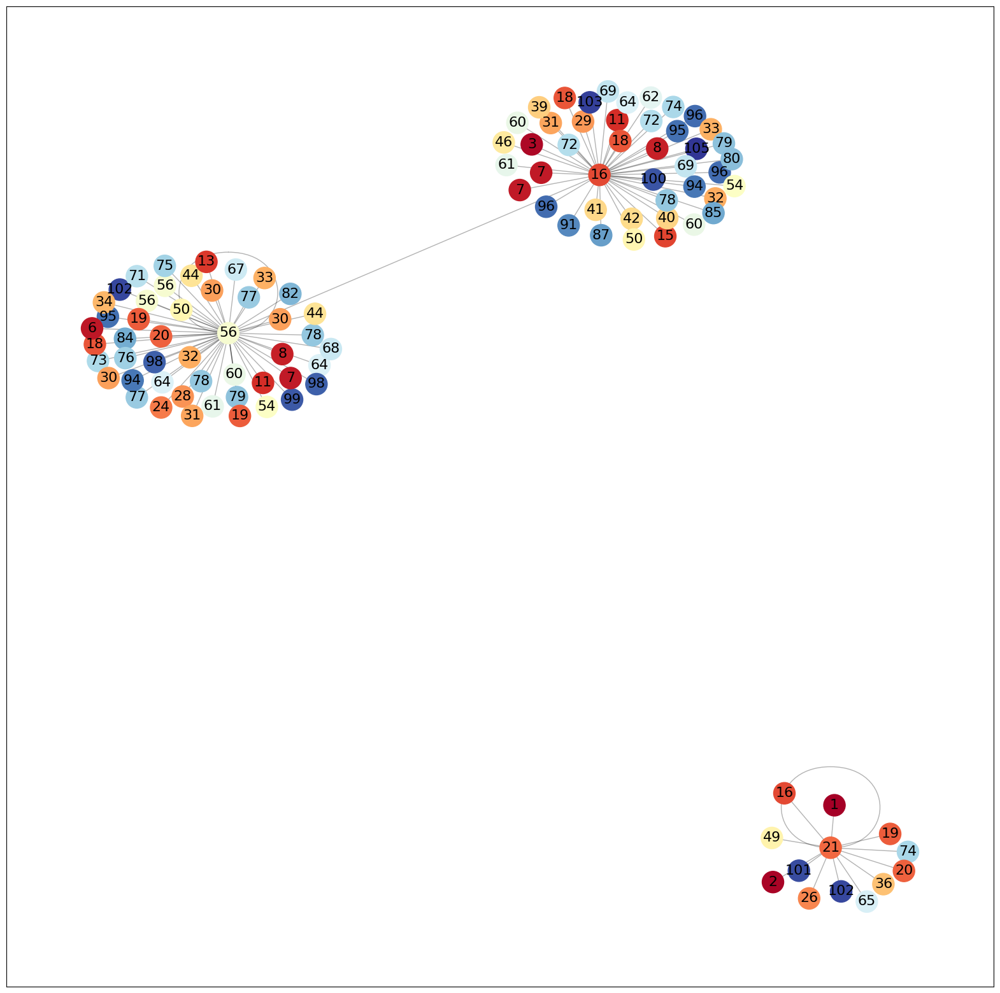

--------------------------------------------------
Processing file: myairlines.txt


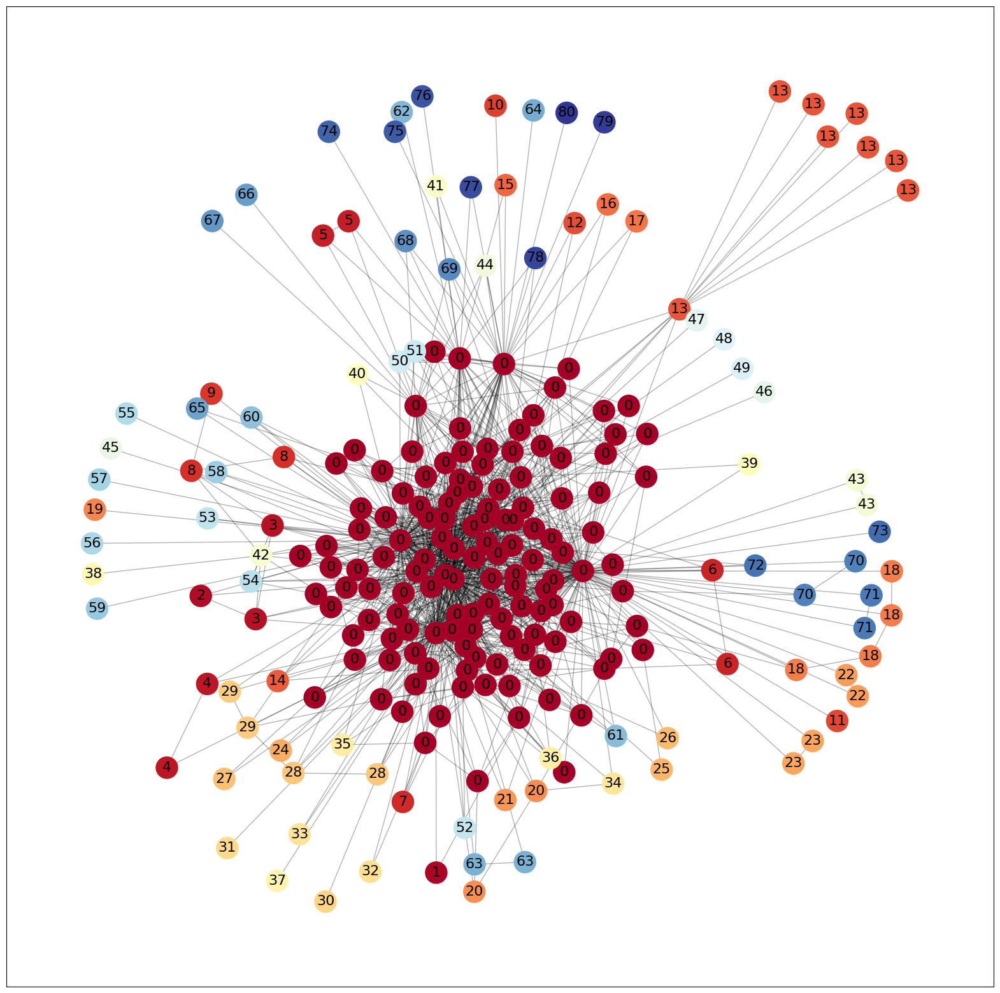

File: myairlines.txt, Comunitatea: ({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 24, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 51, 52, 53, 54, 56, 67, 69, 70, 71, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 85, 86, 87, 88, 92, 93, 94, 95, 97, 98, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 137, 138, 139, 142, 144, 146, 149, 150, 151, 153, 158, 160, 161, 163, 164, 165, 168, 169, 170, 171, 174, 176, 183, 185, 189, 192, 194, 200, 205, 206, 219, 233}, {13}, {19}, {50, 20}, {21, 22}, {25, 23}, {33, 210}, {46}, {48, 186}, {49}, {55}, {57}, {58}, {64, 65, 66, 59, 60, 61, 62, 63}, {68}, {78}, {83}, {84}, {208, 89, 90, 91}, {96}, {162, 99}, {100}, {112, 111}, {113, 114}, {121}, {136}, {140}, {141}, {155, 143}, {145, 159}, {147}, {148}, {152}, {154}, {156}, {157}, {166}, {167}, {172}, {173}, {175}, {177}, {178}, {179, 180}, {181}, {182}, {1

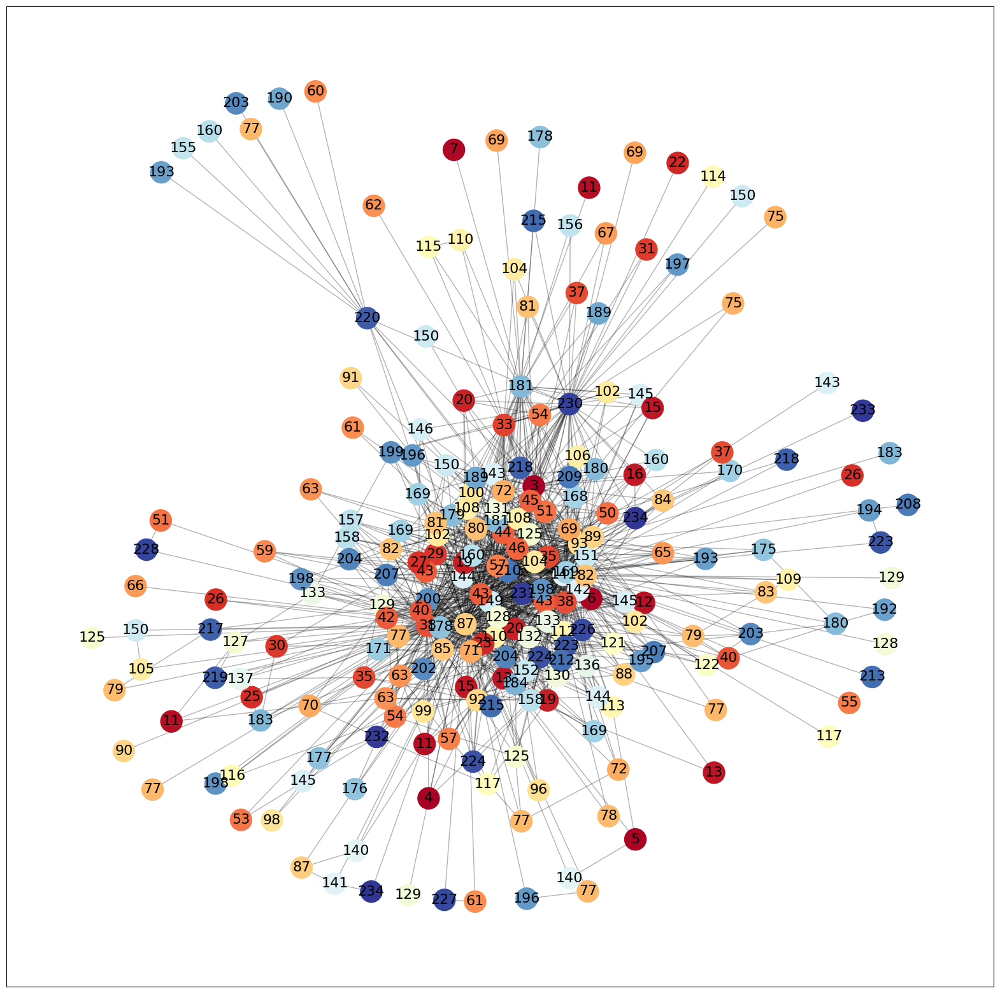

--------------------------------------------------
Processing file: mybergen.txt


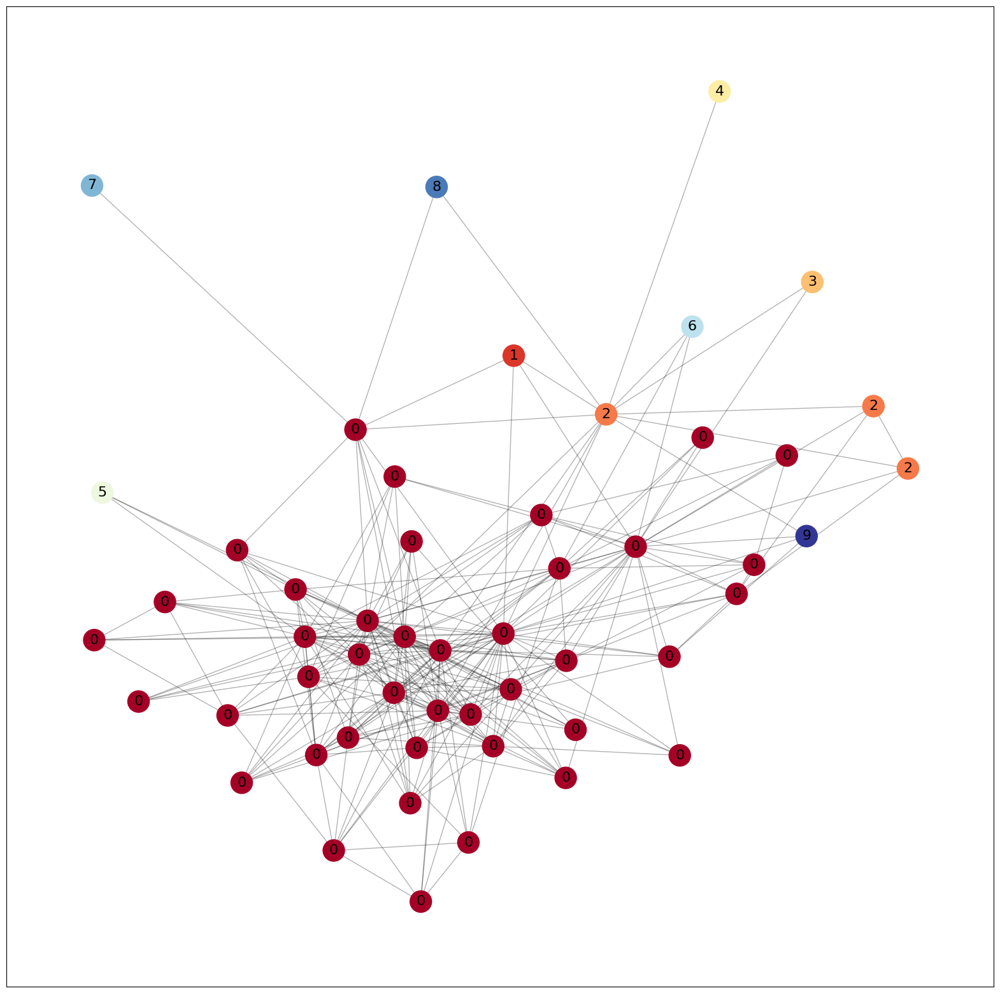

File: mybergen.txt, Comunitatea: ({0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 44, 45, 46}, {3}, {48, 42, 23}, {28}, {35}, {43}, {47}, {49}, {50}, {51})
File: mybergen.txt, Modularitate: 0.03674443122837369
File: mybergen.txt, Comunitatea (Cod Propriu): [11, 18, 42, 11, 34, 34, 4, 8, 32, 40, 49, 39, 18, 29, 43, 35, 9, 13, 36, 16, 43, 6, 45, 23, 45, 42, 26, 8, 47, 31, 6, 12, 47, 28, 50, 47, 17, 41, 14, 19, 11, 28, 27, 29, 12, 44, 1, 52, 10, 26, 29, 30]
File: mybergen.txt, Modularitate (Cod Propriu): -0.0201935553633218


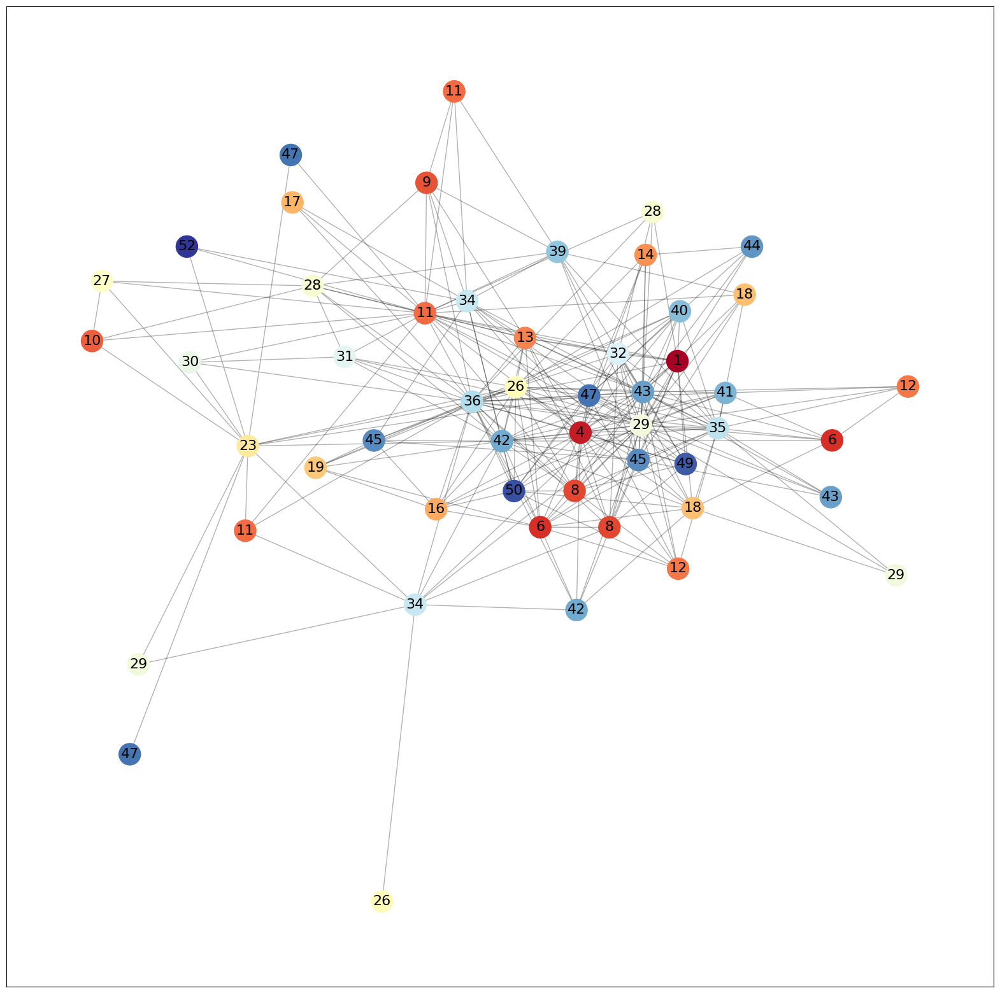

--------------------------------------------------
Processing file: mychicago.txt


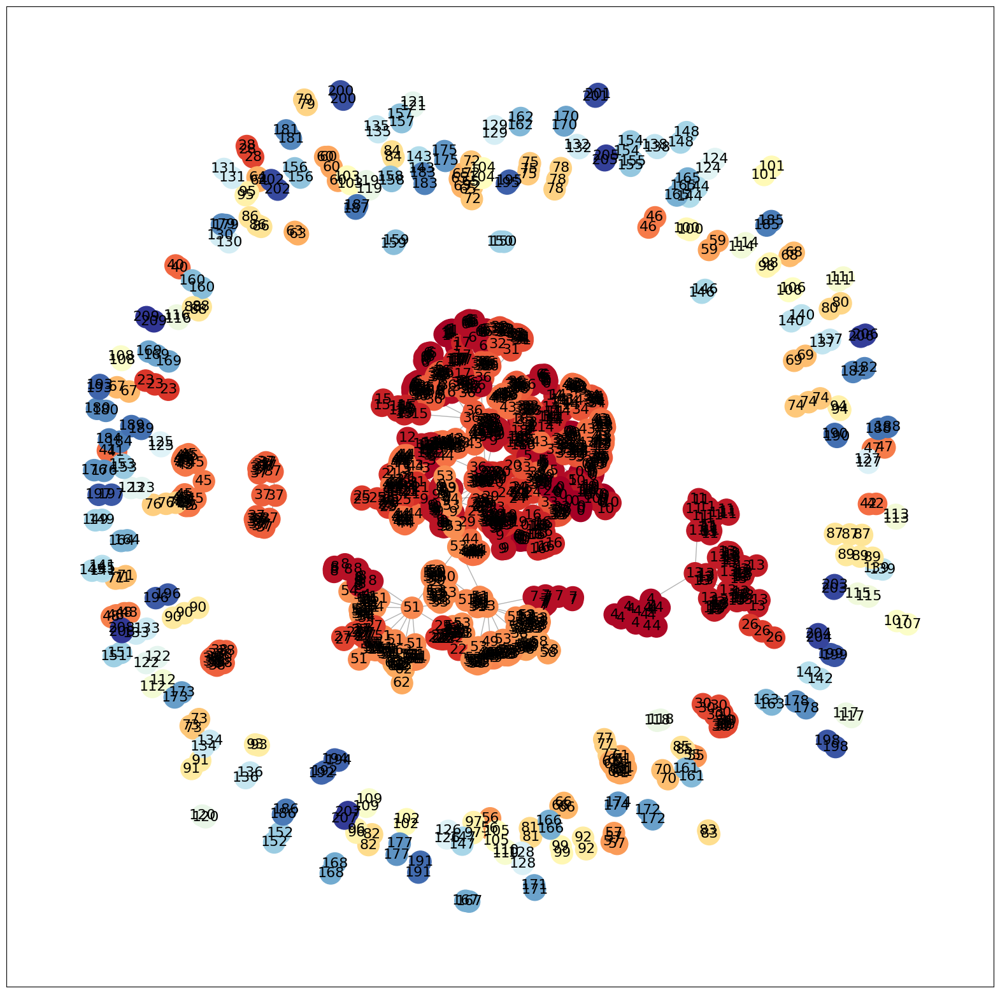

File: mychicago.txt, Comunitatea: ({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 660, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 836, 837, 1097, 1136, 1137, 659, 1142, 1143, 1144, 893}, {41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51}, {185, 146, 52, 53, 54, 55, 56, 57, 58, 155, 151}, {64, 65, 66, 467, 468, 469, 470, 471, 472, 473, 474, 59, 60, 475, 63}, {67, 100, 68, 99, 136, 137, 138, 139, 308, 309, 310, 311, 312, 313, 61, 62}, {480, 481, 482, 483, 484, 69, 70, 485, 476, 477, 478, 479}, {129, 135, 250, 156, 172, 251, 249, 253, 186, 187, 188, 71, 72, 247, 77, 78, 211, 212, 213, 214, 215, 88, 216, 90, 217, 218, 219, 220, 223, 221, 222, 224, 225, 226, 227, 228, 229, 230, 231, 234, 107, 108, 109, 232, 233, 235, 236, 237, 238, 239, 245, 240, 241, 242, 1145, 243, 244, 246, 252, 254, 248}, {832, 833, 834, 838, 840, 73, 74, 841, 842, 183, 827, 828, 831}, {128, 865, 1034, 1035, 75, 76, 1036, 1037, 1038, 1039, 1040, 1041, 84, 1042, 

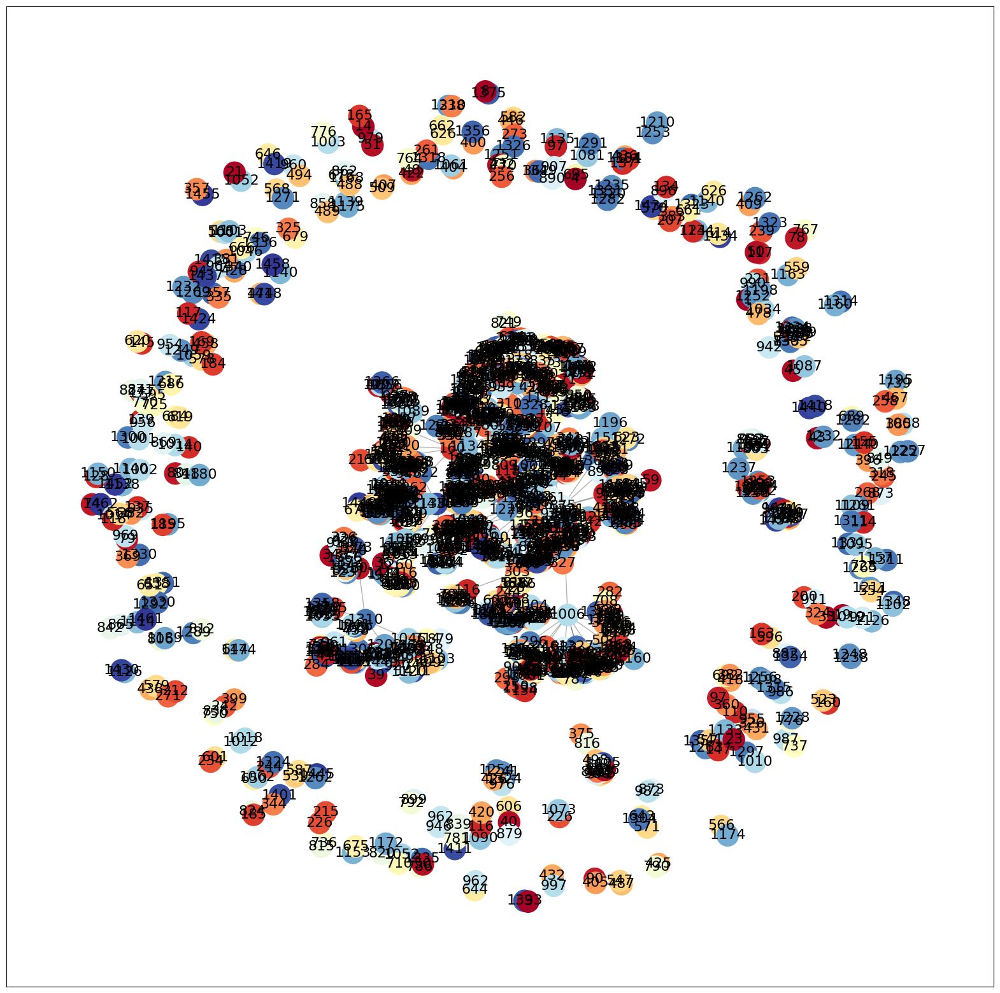

--------------------------------------------------
Processing file: mycodeminer.txt


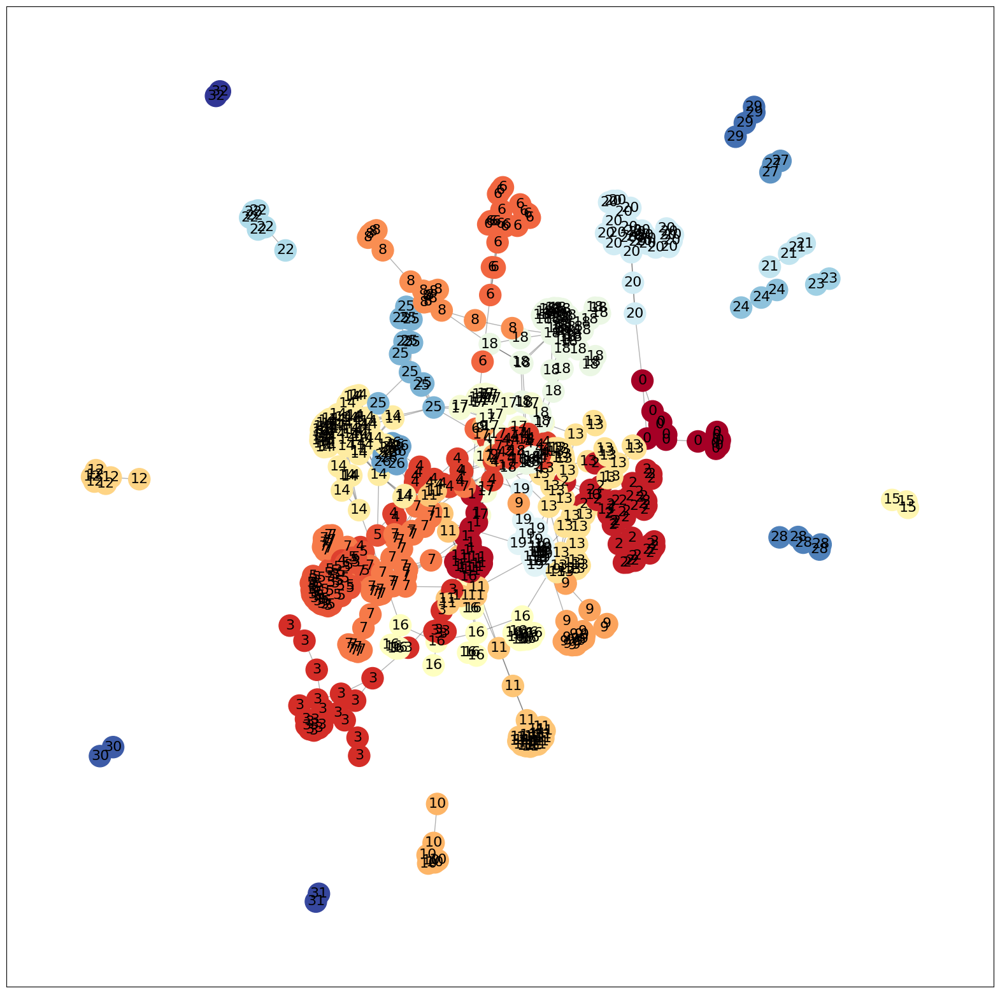

File: mycodeminer.txt, Comunitatea: ({0, 321, 3, 681, 522, 683, 652, 173, 429, 398, 561, 474, 182, 376, 346, 124}, {1, 258, 386, 389, 19, 405, 408, 665, 282, 540, 31, 299, 172, 437, 438, 693, 188, 65, 459, 82, 215, 89, 607, 359, 507}, {2, 644, 518, 647, 12, 140, 143, 656, 15, 18, 527, 532, 278, 152, 411, 668, 288, 545, 546, 166, 39, 40, 170, 171, 48, 176, 316, 572, 705, 194, 452, 329, 586, 467, 86, 599, 91, 347, 351, 610, 354, 104, 361, 108, 240, 112, 629, 630, 117, 508, 253}, {132, 4, 13, 270, 661, 25, 539, 155, 286, 673, 292, 420, 549, 296, 425, 689, 305, 439, 56, 571, 573, 702, 323, 710, 583, 589, 600, 603, 92, 363}, {512, 129, 259, 5, 133, 141, 14, 149, 533, 534, 663, 666, 283, 28, 413, 678, 682, 42, 300, 687, 567, 311, 312, 183, 706, 451, 322, 454, 71, 457, 74, 717, 337, 341, 472, 216, 349, 97, 101, 485, 102, 233, 113, 114, 506, 251, 639}, {256, 257, 513, 131, 640, 641, 6, 9, 137, 11, 138, 266, 650, 655, 529, 274, 275, 22, 664, 669, 35, 675, 38, 680, 556, 45, 686, 432, 694, 440, 1

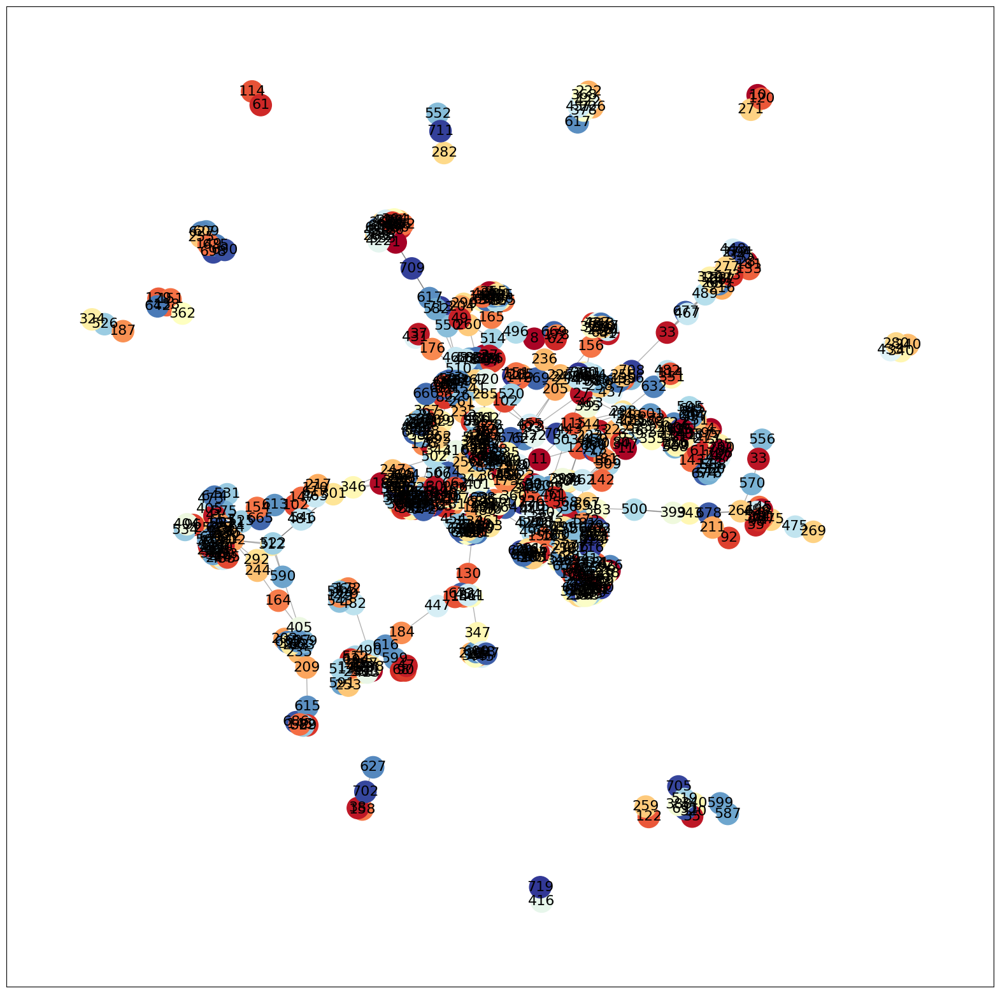

--------------------------------------------------
Processing file: mydolphins.txt


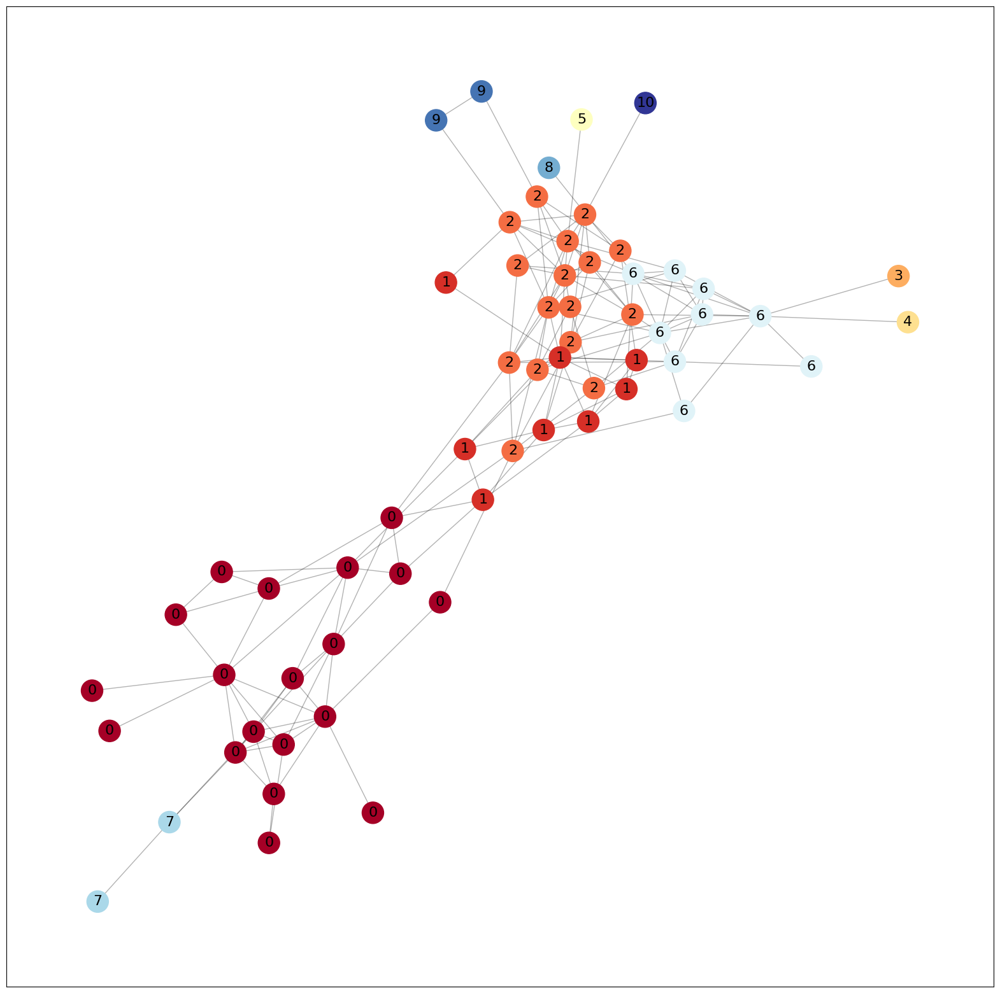

File: mydolphins.txt, Comunitatea: ({0, 4, 5, 6, 8, 12, 16, 18, 21, 24, 25, 26, 30, 38, 40, 47, 53, 55, 56}, {1, 9, 41, 46, 52, 27, 60, 29}, {32, 33, 2, 35, 36, 37, 7, 39, 42, 43, 13, 15, 49, 19, 51, 58}, {3}, {10}, {11}, {44, 14, 17, 50, 20, 54, 23, 22, 28}, {59, 31}, {34}, {48, 45}, {57})
File: mydolphins.txt, Modularitate: 0.4896760412958348
File: mydolphins.txt, Comunitatea (Cod Propriu): [54, 29, 25, 9, 58, 23, 39, 58, 17, 45, 25, 51, 57, 35, 44, 4, 60, 41, 39, 34, 49, 12, 15, 58, 24, 14, 51, 30, 38, 2, 18, 5, 40, 10, 52, 36, 30, 7, 2, 9, 61, 53, 53, 48, 58, 35, 44, 4, 37, 24, 41, 10, 15, 57, 22, 31, 30, 54, 61, 57, 22]
File: mydolphins.txt, Modularitate (Cod Propriu): -0.007278193109449786


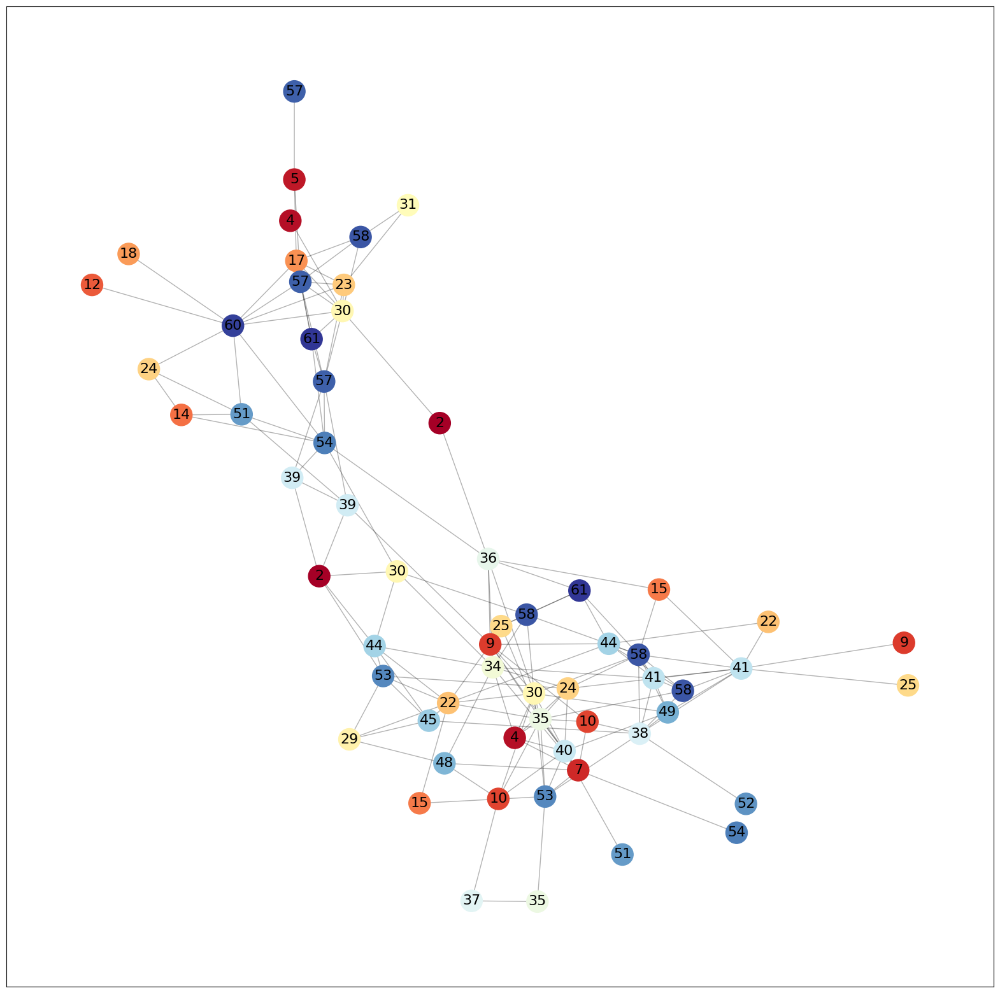

--------------------------------------------------
Processing file: myfootball.txt


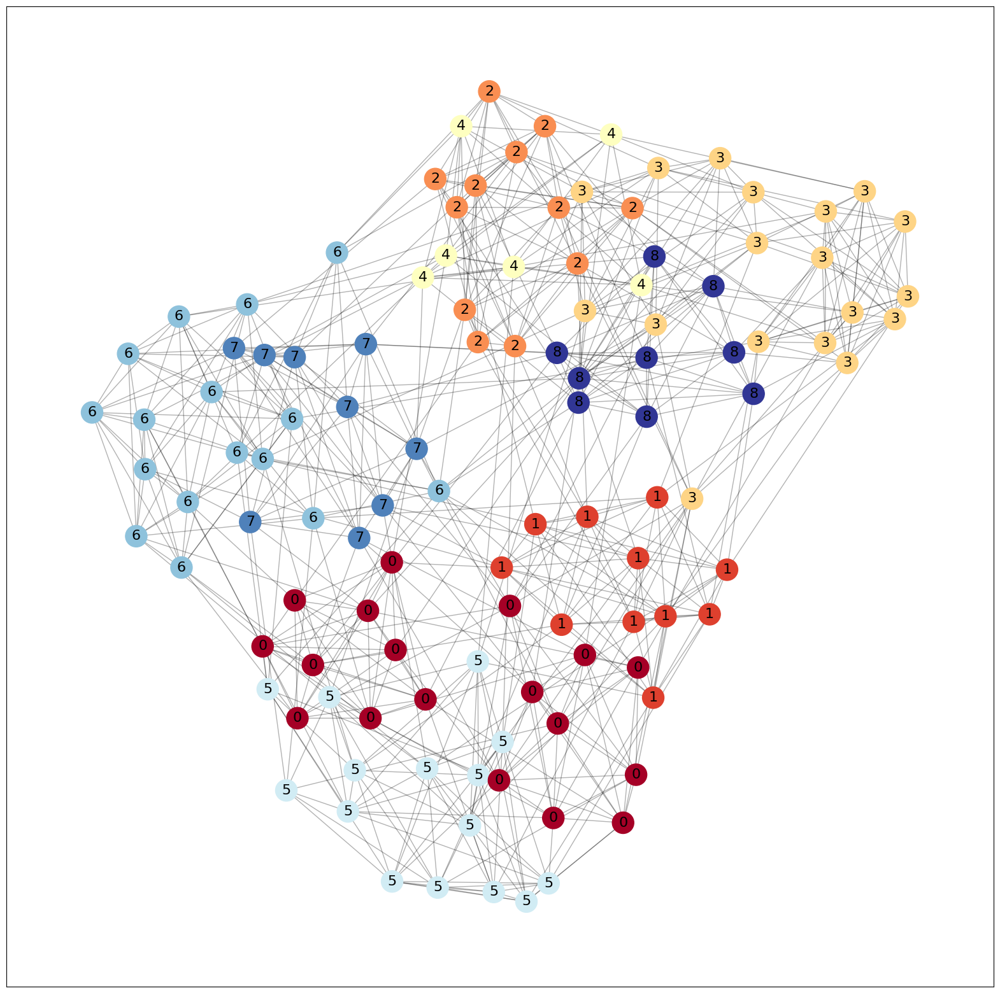

File: myfootball.txt, Comunitatea: ({0, 32, 34, 36, 100, 102, 104, 44, 108, 78, 79, 18, 93, 54, 24, 88, 28, 29}, {1, 99, 5, 38, 105, 12, 46, 14, 59, 31, 63}, {97, 2, 4, 101, 71, 39, 73, 9, 106, 80, 51, 83}, {3, 67, 6, 103, 8, 40, 7, 107, 76, 77, 110, 15, 81, 50, 20, 21, 22, 92}, {68, 10, 49, 23, 89, 27}, {33, 98, 35, 37, 70, 41, 42, 11, 13, 17, 84, 53, 25, 60, 30}, {64, 96, 58, 69, 75, 16, 112, 19, 86, 55, 62, 57, 26, 61, 94, 95}, {65, 74, 43, 47, 111, 85, 56, 90, 91}, {66, 72, 45, 109, 48, 113, 82, 52, 87})
File: myfootball.txt, Modularitate: 0.5904393075312914
File: myfootball.txt, Comunitatea (Cod Propriu): [49, 11, 83, 52, 43, 18, 62, 38, 44, 54, 103, 45, 34, 86, 6, 84, 101, 66, 61, 6, 50, 96, 13, 61, 24, 92, 112, 57, 83, 95, 66, 94, 41, 62, 25, 8, 53, 9, 64, 8, 76, 54, 20, 9, 40, 1, 112, 105, 40, 27, 64, 106, 55, 17, 95, 112, 22, 58, 83, 27, 12, 37, 84, 31, 51, 90, 114, 48, 31, 84, 17, 72, 23, 53, 104, 16, 20, 37, 52, 43, 3, 9, 86, 24, 83, 73, 24, 93, 78, 111, 111, 41, 17, 75, 97,

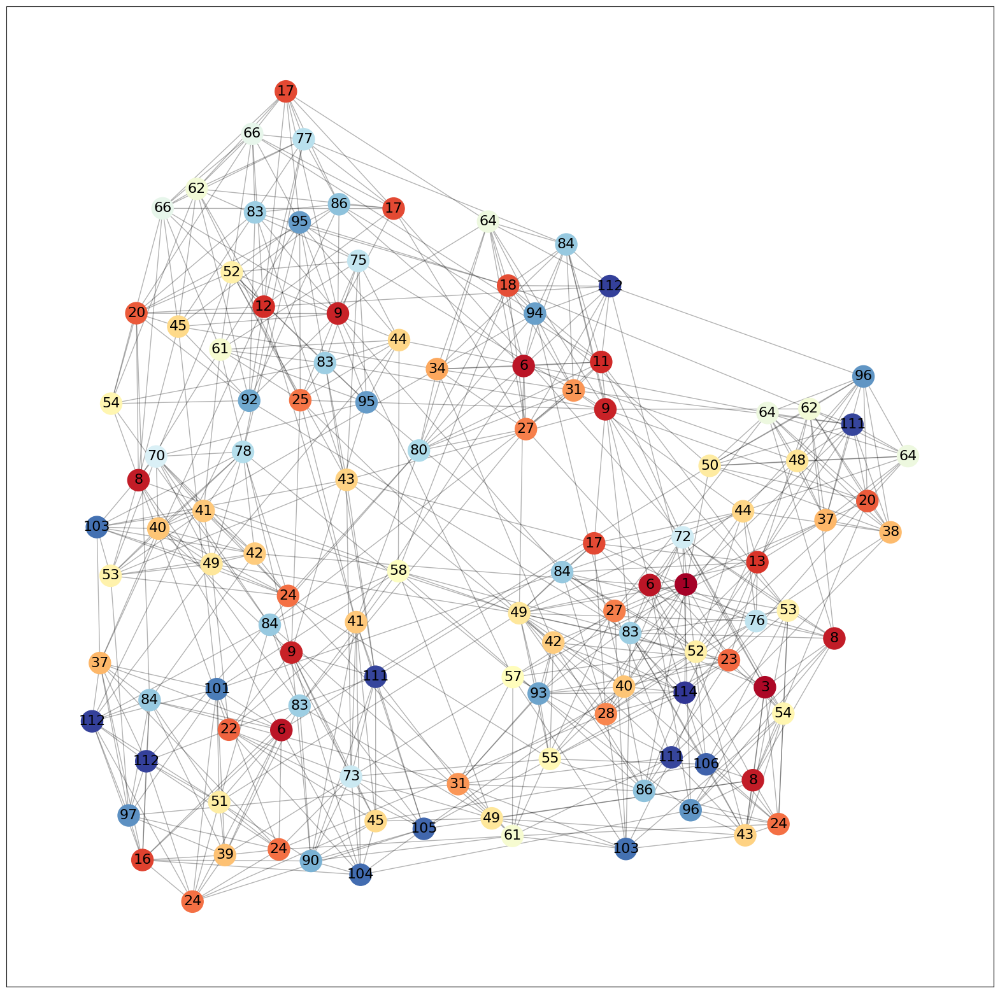

--------------------------------------------------


In [300]:
for file in os.listdir(os.path.join(crtDir, 'networks')):
    if file.endswith('.txt'):
        print(f"Processing file: {file}")
        filePath = os.path.join(crtDir, 'networks', file)
        network = read.readNetEdges(filePath)
        c, modularity = findSolutionTool(network)
    
        print(f"File: {file}, Comunitatea: {c}")
        print(f"File: {file}, Modularitate: {modularity}")
        
        c,modularity = findSolution(network)
        
        print(f"File: {file}, Comunitatea (Cod Propriu): {c}")
        print(f"File: {file}, Modularitate (Cod Propriu): {modularity}")
        plot(c, network, imgSize=(20, 20))
        print("-" * 50)